In [1]:
import sklearn.datasets as datasets
import pandas as pd
iris=datasets.load_iris()
df=pd.DataFrame(iris.data, columns=iris.feature_names)
y=iris.target

# Iris data sample


In [2]:
df.head()
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [3]:
from sklearn.tree import DecisionTreeClassifier
dtree_iris = DecisionTreeClassifier(criterion='gini')
dtree_iris.fit(df,y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [4]:
from sklearn.tree import export_graphviz
from IPython.display import Image
def plotTree(dtree, imgfile, features, targets):
    export_graphviz(dtree, out_file=imgfile, feature_names = features,
                class_names = targets,
                rounded = True, proportion = False, precision = 2, filled = True)
    outfile=imgfile+".png"
    !dot -Tpng "$imgfile" -o "$outfile" -Gdpi=600
    Image(filename = outfile)
    


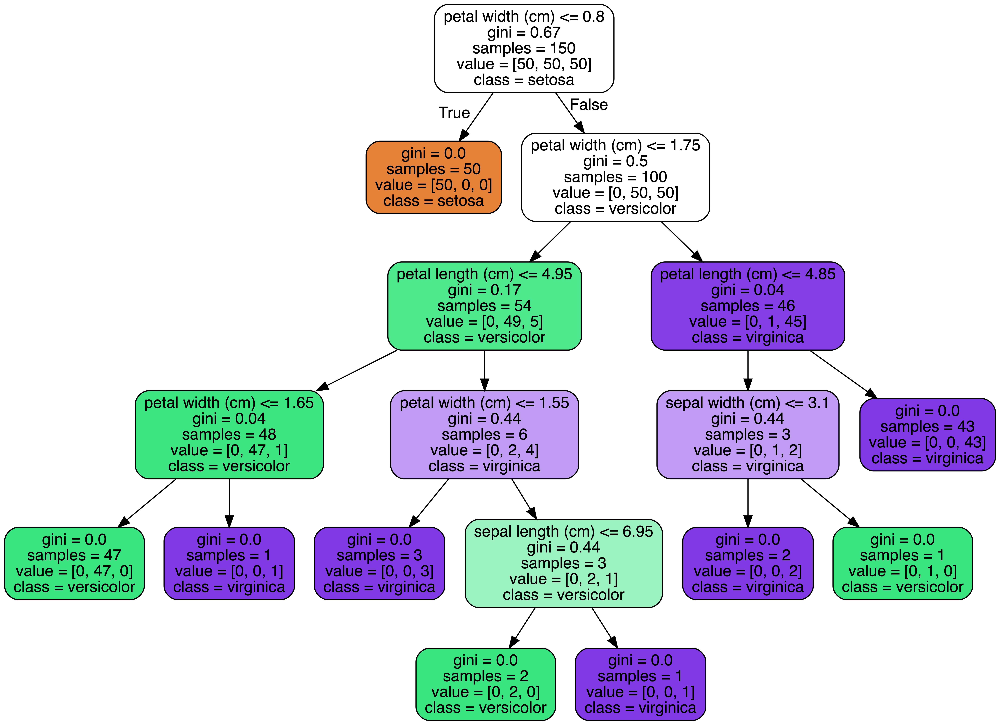

In [5]:
imgfile="iris.dot"
plotTree(dtree_iris, imgfile, iris.feature_names, iris.target_names)
Image(filename = imgfile+'.png')

In [6]:
cancerdata=datasets.load_breast_cancer()
dfcancer=pd.DataFrame(cancerdata.data, columns=cancerdata.feature_names)
ycancer=cancerdata.target

In [7]:
dfcancer.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [8]:
dtree=DecisionTreeClassifier(criterion='entropy')
dtree.fit(dfcancer,ycancer)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [9]:
import numpy as np
seed=0
np.random.seed(seed)
msk = np.random.rand(len(dfcancer)) < 0.8
train_x = dfcancer[msk]
train_y = cancerdata.target[msk]
test_x = dfcancer[~msk]
test_y = cancerdata.target[~msk]

In [10]:
len(train_x)

458

In [11]:
len(test_x)

111

In [12]:
dtree=DecisionTreeClassifier(criterion='entropy', max_depth=3)
dtmodel = dtree.fit(train_x, train_y)

In [13]:
y_pred = dtmodel.predict(test_x)

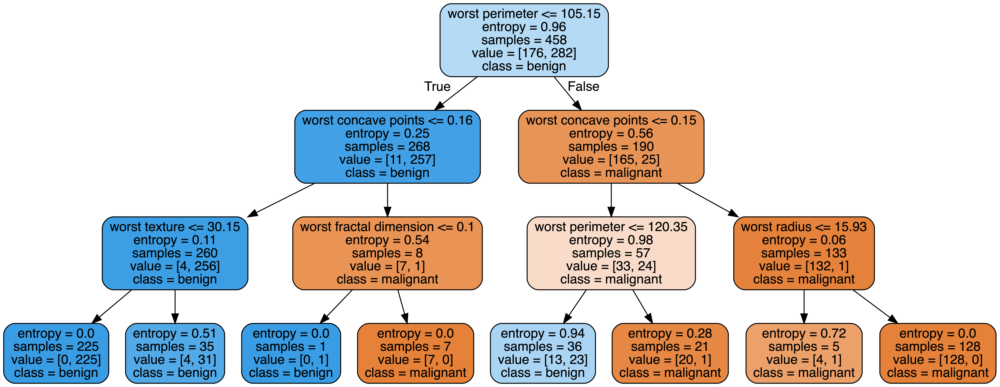

In [14]:
imgfile="cancer.dot"
plotTree(dtree, imgfile, cancerdata.feature_names, cancerdata.target_names)
Image(filename = imgfile+'.png')

In [15]:
from sklearn.metrics import accuracy_score

In [16]:
accuracy_score(test_y, y_pred)

0.9279279279279279

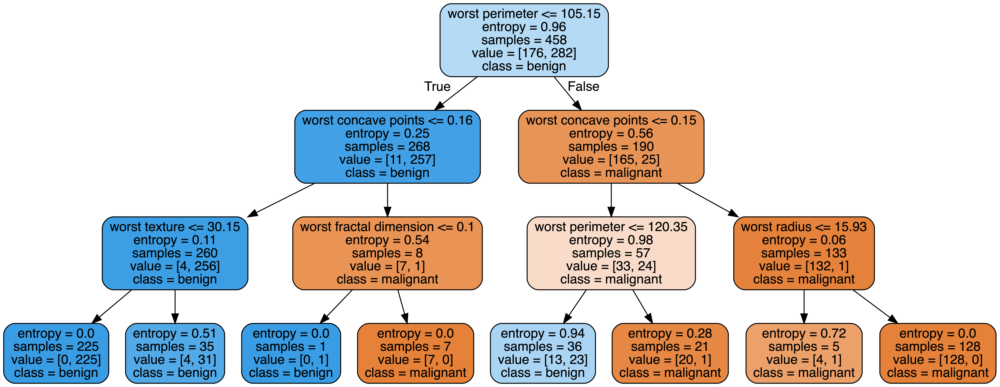

In [17]:
imgfile="cancer.dot"
plotTree(dtree, imgfile, cancerdata.feature_names, cancerdata.target_names)
Image(filename = imgfile+'.png')

In [18]:
from sklearn.model_selection import cross_val_score
cv_acc = cross_val_score(dtree, cancerdata.data, cancerdata.target, cv=10)

In [19]:
np.average(cv_acc)

0.9404653876069483

In [20]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_y, y_pred)
cm

array([[29,  7],
       [ 1, 74]])

In [21]:
TP = cm[0][0]
TN = cm[1][1]
FP = cm[0][1]
FN = cm[1][0]

In [22]:
(TP + TN)/(TP+ TN + FP + FN)

0.9279279279279279

In [23]:
from sklearn.metrics import roc_curve, roc_auc_score
fpr, tpr, thresholds = roc_curve(test_y, y_pred)

In [24]:
from matplotlib import pyplot
probs = dtree.predict_proba(test_x)
probs

array([[1.        , 0.        ],
       [0.8       , 0.2       ],
       [0.36111111, 0.63888889],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.95238095, 0.04761905],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.11428571, 0.88571429],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.36111111, 0.63888889],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.36111111, 0.63888889],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.

AUC: 0.944


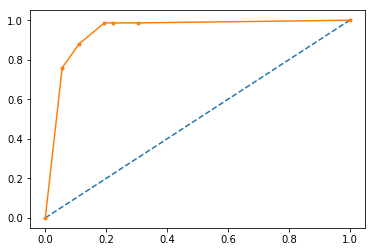

In [25]:
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUROC = Area Under ROC Curve 
auc = roc_auc_score(test_y, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds = roc_curve(test_y, probs)
# plot no skill
pyplot.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
pyplot.plot(fpr, tpr, marker='.')
# show the plot
pyplot.show()

In [26]:
probs_sorted = sorted(probs)

In [27]:
probs_sorted

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.047619047619047616,
 0.047619047619047616,
 0.047619047619047616,
 0.2,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.6388888888888888,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 0.8857142857142857,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 

In [73]:
from sklearn.ensemble import RandomForestClassifier
clf_rforest = RandomForestClassifier(n_estimators=100, random_state=1, max_features='sqrt')

In [74]:
clf_rforest.fit(train_x, train_y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='sqrt', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=1, verbose=0, warm_start=False)

In [75]:
from sklearn.model_selection import cross_val_score
cval = cross_val_score(clf_rforest, cancerdata.data, cancerdata.target, cv=10)

In [76]:
np.average(cval)

0.9632745657246564

In [31]:
y_pred = clf_rforest.predict(test_x)

In [32]:
accuracy_score(test_y, y_pred)

0.9369369369369369

In [77]:
from sklearn.tree import export_graphviz
# Export as dot file
estimator_limited = clf_rforest.estimators_[2]
export_graphviz(estimator_limited, 
                out_file='rforest.dot', 
                feature_names = cancerdata.feature_names,
                class_names = cancerdata.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [78]:
# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'rforest.dot', '-o', 'rforest.png', '-Gdpi=600'])

0

In [79]:
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'rforest.png')

In [80]:
from sklearn.tree import export_graphviz
# Export as dot file
estimator_limited = clf_rforest.estimators_[10]
export_graphviz(estimator_limited, 
                out_file='rforest.dot', 
                feature_names = cancerdata.feature_names,
                class_names = cancerdata.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)
# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'rforest.dot', '-o', 'rforest.png', '-Gdpi=600'])
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'rforest.png')

In [96]:
from sklearn.neighbors import KNeighborsClassifier
nbrs = KNeighborsClassifier(n_neighbors=50).fit(train_x, train_y)
nbrs

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=50, p=2,
           weights='uniform')

In [97]:
distances, indices = nbrs.kneighbors(test_x)

In [98]:
distances, indices

(array([[ 15.88094035,  39.70172991,  47.86094081, ..., 147.00992396,
         147.66490696, 148.97526381],
        [ 15.58763714,  25.59299054,  26.01253618, ...,  98.13265551,
          98.18621075,  98.86936183],
        [ 29.56059218,  49.01576545,  51.14016584, ..., 168.17877151,
         169.08446677, 169.10021825],
        ...,
        [ 23.88935262,  50.60542497,  53.55880915, ..., 341.39746189,
         344.12578388, 362.77688469],
        [ 52.66486167,  53.53813024,  58.95249533, ..., 346.67088369,
         348.33070802, 379.91259071],
        [ 20.84520284,  37.47520926,  42.0959641 , ..., 196.40141676,
         197.42225323, 206.827113  ]]),
 array([[ 85,  35, 355, ...,  39, 122, 158],
        [ 36,  39, 376, ...,  78,  60, 265],
        [309, 289, 389, ...,  80,  45,  29],
        ...,
        [ 81, 242, 195, ..., 371, 257, 147],
        [214, 433, 300, ..., 352, 131, 371],
        [436,  38,  52, ..., 179, 185,  88]]))

In [99]:
distances[0], train_y[indices[1]]

(array([ 15.88094035,  39.70172991,  47.86094081,  58.46950794,
         59.40268033,  73.81375703,  74.78119907,  74.87261363,
         75.23419754,  77.03462749,  81.29250963,  82.10081719,
         86.62409813,  89.67153809,  90.31146215,  90.99719633,
         93.36669566,  94.33867055,  95.74311905,  96.52571288,
         96.80480596,  98.01007309,  98.84541171, 106.49113206,
        111.40429924, 113.46869936, 113.65983481, 114.65006148,
        114.6515895 , 115.12431364, 117.63751205, 119.39924531,
        120.22689611, 121.54261503, 121.97955901, 127.61546281,
        128.83324937, 129.18359593, 135.6905668 , 138.7659743 ,
        140.14184492, 140.41459546, 142.52696002, 142.80146639,
        143.17255333, 143.26978423, 146.52014439, 147.00992396,
        147.66490696, 148.97526381]),
 array([0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
        1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1,
        1, 0, 1, 1, 0, 1]))

In [100]:
pred_y = nbrs.predict(test_x)

In [101]:
accuracy_score(test_y, pred_y)

0.9369369369369369

NameError: name 'X' is not defined